In [21]:
import csv
import re

import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth', 700)

In [2]:
data_df = pd.read_csv('/home/anau/SOD_labeling/experiment_2/processed/stages.csv.20221114_correct',
                     header=None, )
data_df.columns = ['img', 'label', 'bodypart']
#data_df['img'] = data_df['img'].str.replace('.icon','')
#data_df['img'] = data_df['img'].str.replace('/anau','/da1_data/icputrd/arf/mean.js/public/anau')

In [3]:
print(data_df.shape)
display(data_df.head())

(4731, 3)


,img,label,bodypart
0,/anau_img3/000/00000122.08.icon.JPG,2,head
1,/anau_img3/000/00000129.14.icon.JPG,3,head
2,/anau_img3/000/00000213.21.icon.JPG,7,head
3,/anau_img3/000/00000219.07.icon.JPG,7,head
4,/anau_img3/000/00000222.08.icon.JPG,9,head


In [4]:
display(data_df.describe())
display(data_df.info())

,label
count,4731.000000
mean,6.789685
std,3.247173
min,1.000000
25%,4.000000
50%,7.000000
75%,10.000000
max,13.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4731 entries, 0 to 4730
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   img       4731 non-null   object
 1   label     4731 non-null   int64 
 2   bodypart  4731 non-null   object
dtypes: int64(1), object(2)
memory usage: 111.0+ KB


None

## Class distribution

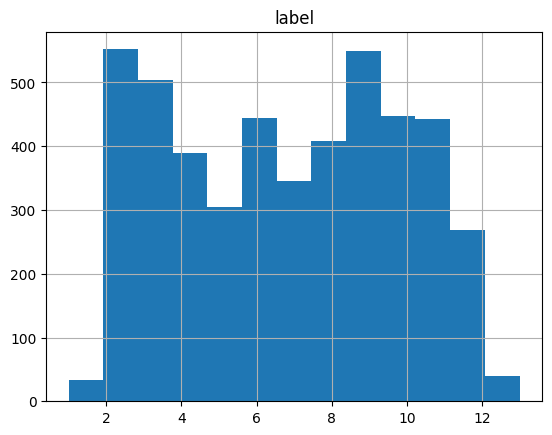

In [36]:
data_df.hist(column='label', bins=13)
plt.show()

## Image size distribution

In [7]:
directory = '/home/anau/SOD_labeling/experiment_2/processed/'
filename = 'stages.csv.20221114_correct'
classes = ['1','2','3','4','5','6','7','8','9','10','11','12','13']

In [12]:
with open(directory+filename, 'r') as csvfile:
    datareader = csv.reader(csvfile)
    size_ls = []
    for row in datareader:
        # modify image path
        path = '/da1_data/icputrd/arf/mean.js/public'+row[0]
        path = re.sub('.icon', '', path)

        # reading image
        img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
        size_ls.append(img.shape)

In [38]:
print(data_df.shape)
print(len(size_ls))

(4731, 3)
4731


In [16]:
sizes_df = pd.DataFrame({'size': size_ls})
sizes_counts = sizes_df['size'].value_counts()
for i in range(len(sizes_counts)):
    print("Shape %s counts: %d" % (sizes_counts.index[i], sizes_counts.values[i]))

Shape (2000, 2992, 3) counts: 1770
Shape (1632, 2464, 3) counts: 1580
Shape (1424, 2144, 3) counts: 430
Shape (3264, 4928, 3) counts: 411
Shape (4000, 6000, 3) counts: 376
Shape (2136, 3216, 3) counts: 145
Shape (1280, 1920, 3) counts: 11
Shape (1488, 2240, 3) counts: 3
Shape (2848, 4288, 3) counts: 3
Shape (1936, 2896, 3) counts: 1
Shape (480, 640, 3) counts: 1


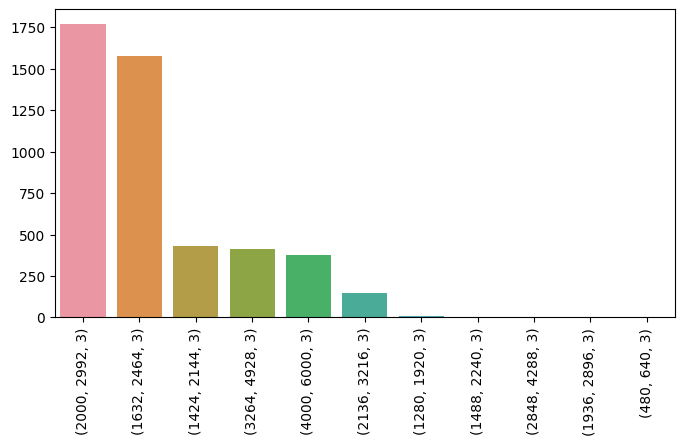

In [35]:
# Plot distribution image shapes
plt.figure(figsize=(8, 4))
sns.barplot(x=sizes_counts.index, y=sizes_counts.values)
plt.xticks(rotation=90)
plt.show()

## View an image

(2992, 2000)


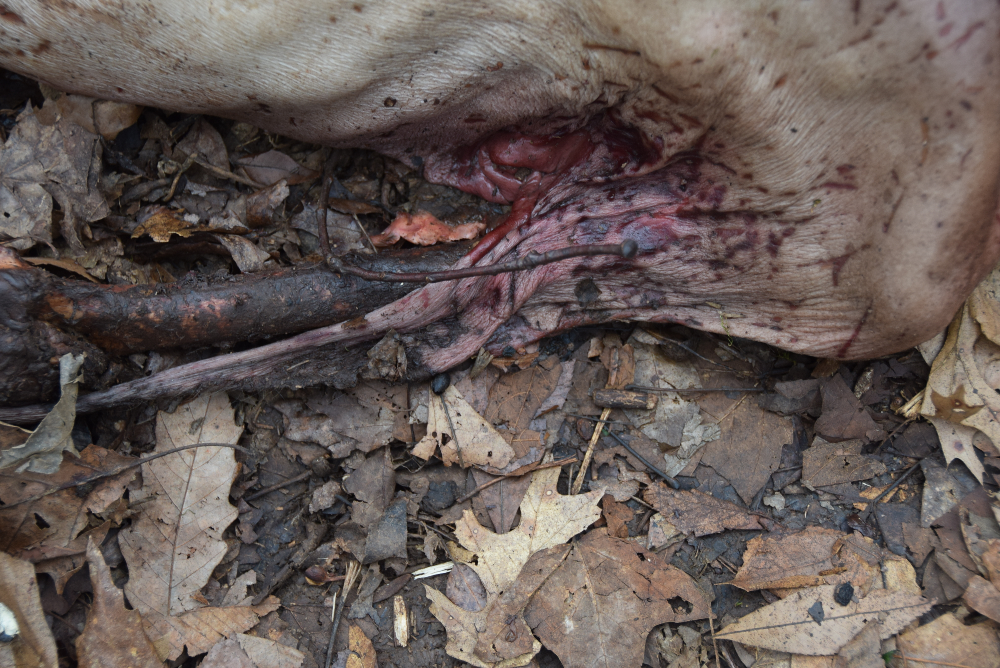

In [33]:
im = Image.open('/da1_data/icputrd/arf/mean.js/public/anau_img3/000/00000201.18.JPG') 
print(im.size)
im.show() 